# **Renewable Power Generation and weather Conditions**

## About Dataset

**Description:**

Imagine having access to a treasure trove of information that reveals how weather directly impacts renewable energy generation. This dataset, meticulously compiled with hourly measurements, is your key to unlocking those secrets.

**Delving into the Details:**

- Solar Power's Prime Driver: The dataset features "Global Horizontal Irradiance (GHI)" readings, which tell you the exact amount of solar radiation hitting a flat surface every hour. This is crucial, as sunlight is the lifeblood of solar energy production.
- Beyond Sunshine: But weather has more to offer than just sunshine. The dataset also includes data on temperature, humidity, and precipitation – all playing a role in energy production and consumption.
- Time Makes a Difference: By incorporating "dayLength" and "sunlightTime" measurements, you can see how the amount of daylight and sunshine availability directly affects energy generation patterns.

**Use Cases**
- Predict Renewable Energy Output: By analyzing the relationship between weather and past energy generation, you can develop models to predict future output, aiding in grid management and energy planning.

- Understand Energy Demand: Weather can also influence energy consumption. Studying how temperature and other factors affect demand can help optimize energy infrastructure and distribution.

**Provider:** Afroz

Reference: https://www.kaggle.com/datasets/pythonafroz/renewable-power-generation-and-weather-conditions/data

## About this notebook

For this notebook, we refer the source code shared by Afroz on Kaggle as a reference.
(https://www.kaggle.com/code/pythonafroz/renewable-power-gen-prediction-with-time-series/notebook)

## Setup

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor
import xgboost as xgb

import warnings
warnings.filterwarnings("ignore", category=UserWarning) 
#%matplotlib inline

## Importing the dataset

In [2]:
filepath = "C:/Users/User/My Porject (Jupyter notebook)/Database/Renewable.csv"

df = pd.read_csv(filepath, header=0)

In [3]:
# show the first 5 rows using dataframe.head() method
print("The first 5 rows of the dataframe") 
df.head(5)

The first 5 rows of the dataframe


,Time,Energy delta[Wh],GHI,temp,pressure,humidity,wind_speed,rain_1h,snow_1h,clouds_all,isSun,sunlightTime,dayLength,SunlightTime/daylength,weather_type,hour,month
0,2017-01-01 00:00:00,0,0.0,1.6,1021,100,4.9,0.0,0.0,100,0,0,450,0.0,4,0,1
1,2017-01-01 00:15:00,0,0.0,1.6,1021,100,4.9,0.0,0.0,100,0,0,450,0.0,4,0,1
2,2017-01-01 00:30:00,0,0.0,1.6,1021,100,4.9,0.0,0.0,100,0,0,450,0.0,4,0,1
3,2017-01-01 00:45:00,0,0.0,1.6,1021,100,4.9,0.0,0.0,100,0,0,450,0.0,4,0,1
4,2017-01-01 01:00:00,0,0.0,1.7,1020,100,5.2,0.0,0.0,100,0,0,450,0.0,4,1,1


Convert the 'Time' column to datetime (Dtype from "object" become "datetime64[ns]")

In [4]:
df['Time'] = pd.to_datetime(df['Time'])

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 196776 entries, 0 to 196775
Data columns (total 17 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   Time                    196776 non-null  datetime64[ns]
 1   Energy delta[Wh]        196776 non-null  int64         
 2   GHI                     196776 non-null  float64       
 3   temp                    196776 non-null  float64       
 4   pressure                196776 non-null  int64         
 5   humidity                196776 non-null  int64         
 6   wind_speed              196776 non-null  float64       
 7   rain_1h                 196776 non-null  float64       
 8   snow_1h                 196776 non-null  float64       
 9   clouds_all              196776 non-null  int64         
 10  isSun                   196776 non-null  int64         
 11  sunlightTime            196776 non-null  int64         
 12  dayLength               196776

In [6]:
# Check for missing values
df.isna().sum()

Time                      0
Energy delta[Wh]          0
GHI                       0
temp                      0
pressure                  0
humidity                  0
wind_speed                0
rain_1h                   0
snow_1h                   0
clouds_all                0
isSun                     0
sunlightTime              0
dayLength                 0
SunlightTime/daylength    0
weather_type              0
hour                      0
month                     0
dtype: int64

In [7]:
# Check for duplicates
df.duplicated().sum()

0

In [8]:
# Check the number of unique
df.nunique()

Time                      196776
Energy delta[Wh]            4556
GHI                         2277
temp                         503
pressure                      71
humidity                      79
wind_speed                   136
rain_1h                      311
snow_1h                      129
clouds_all                   101
isSun                          2
sunlightTime                  69
dayLength                     39
SunlightTime/daylength       101
weather_type                   5
hour                          24
month                         12
dtype: int64

### Summary Statistics

In [9]:
print("From Time : ",df['Time'].min())
print("To Time   : ",df['Time'].max())

From Time :  2017-01-01 00:00:00
To Time   :  2022-08-31 17:45:00


In [15]:
df.describe()

,Time,Energy delta[Wh],GHI,temp,pressure,humidity,wind_speed,rain_1h,snow_1h,clouds_all,isSun,sunlightTime,dayLength,SunlightTime/daylength,weather_type,hour,month
count,196776,196776.000000,196776.000000,196776.000000,196776.000000,196776.000000,196776.000000,196776.000000,196776.000000,196776.000000,196776.000000,196776.000000,196776.000000,196776.000000,196776.000000,196776.000000,196776.000000
mean,2019-10-29 22:44:12.085620992,573.008228,32.596538,9.790521,1015.292780,79.810566,3.937746,0.066035,0.007148,65.974387,0.519962,211.721094,748.644347,0.265187,3.198398,11.498902,6.298329
min,2017-01-01 00:00:00,0.000000,0.000000,-16.600000,977.000000,22.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,450.000000,0.000000,1.000000,0.000000,1.000000
25%,2018-06-02 10:26:15,0.000000,0.000000,3.600000,1010.000000,70.000000,2.600000,0.000000,0.000000,34.000000,0.000000,0.000000,570.000000,0.000000,2.000000,5.000000,3.000000
50%,2019-10-28 20:52:30,0.000000,1.600000,9.300000,1016.000000,84.000000,3.700000,0.000000,0.000000,82.000000,1.000000,30.000000,765.000000,0.050000,4.000000,11.000000,6.000000
75%,2021-03-24 07:18:45,577.000000,46.800000,15.700000,1021.000000,92.000000,5.000000,0.000000,0.000000,100.000000,1.000000,390.000000,930.000000,0.530000,4.000000,17.000000,9.000000
max,2022-08-31 17:45:00,5020.000000,229.200000,35.800000,1047.000000,100.000000,14.300000,8.090000,2.820000,100.000000,1.000000,1020.000000,1020.000000,1.000000,5.000000,23.000000,12.000000
std,NaN,1044.824047,52.172018,7.995428,9.585773,15.604459,1.821694,0.278913,0.069710,36.628593,0.499603,273.902186,194.870208,0.329023,1.289939,6.921887,3.376066


## Detail for the dataset
- **Time**: The timestamp of the recorded data in the format of YYYY-MM-DD HH:MM:SS.
- **Energy delta[Wh]**: The difference in energy consumption in Watt-hours (Wh) from the previous timestamp to the current timestamp.
- **GHI**: Global Horizontal Irradiance in Watts per square meter (W/m²) measured by a pyranometer.
- **temp**: The temperature in degrees Celsius (°C) measured at the same height as the pyranometer.
- **pressure**: The atmospheric pressure in hectopascals (hPa) measured at the same height as the pyranometer.
- **humidity**: The relative humidity in percentage (%) measured at the same height as the pyranometer.
- **wind_speed**: The wind speed in meters per second (m/s) measured at the same height as the pyranometer.
- **rain_1h**: The amount of precipitation in millimeters (mm) measured over the past hour.
- **snow_1h**: The amount of snowfall in millimeters
- **clouds_all**: The cloud situation.

## Exploratory Data Analysis (EDA)

### Visualize feature 'Energy delta[Wh]'

Select a subset of 'Energy delta[Wh]' that is non-zero.

In [16]:
df = df[df['Energy delta[Wh]'] != 0]
df.head()

,Time,Energy delta[Wh],GHI,temp,pressure,humidity,wind_speed,rain_1h,snow_1h,clouds_all,isSun,sunlightTime,dayLength,SunlightTime/daylength,weather_type,hour,month
32,2017-01-01 08:00:00,5,10.6,3.5,1016,99,6.0,0.0,0.0,98,1,60,450,0.13,4,8,1
33,2017-01-01 08:15:00,33,6.0,3.5,1016,99,6.0,0.0,0.0,98,1,75,450,0.17,4,8,1
34,2017-01-01 08:30:00,44,2.8,3.5,1016,99,6.0,0.0,0.0,98,1,90,450,0.20,4,8,1
35,2017-01-01 08:45:00,61,3.1,3.5,1016,99,6.0,0.0,0.0,98,1,105,450,0.23,4,8,1
36,2017-01-01 09:00:00,65,3.5,3.6,1016,97,6.2,0.0,0.0,100,1,120,450,0.27,4,9,1


Energy consumption for only 2018

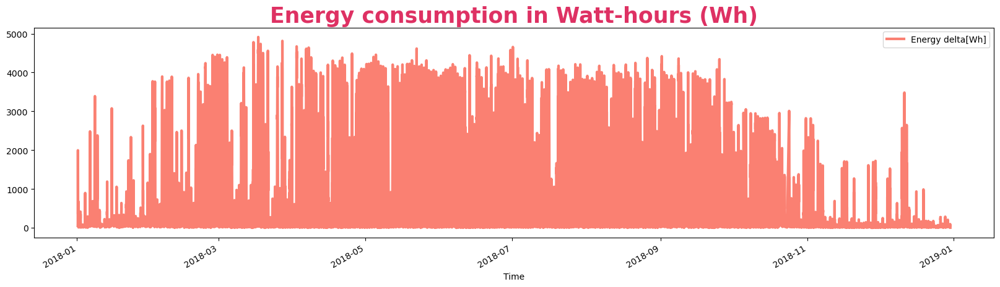

In [12]:
df1 = df[['Time','Energy delta[Wh]']].copy('Deep')
df1 = df1.set_index('Time')
df_2018 = df1[(df1.index >= '2018-01-01') & (df1.index < '2018-12-31')]
df_2018.plot(figsize=(20,5), lw=3,color = '#FA8072')
plt.title('Energy consumption in Watt-hours (Wh)', weight='bold', fontsize=25,color = '#DE3163'); 

Energy consumption for every year from 2017 to 2022

C:\Users\User\AppData\Local\Temp\ipykernel_3552\2681976205.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20')  # Choose a colormap with bright colors


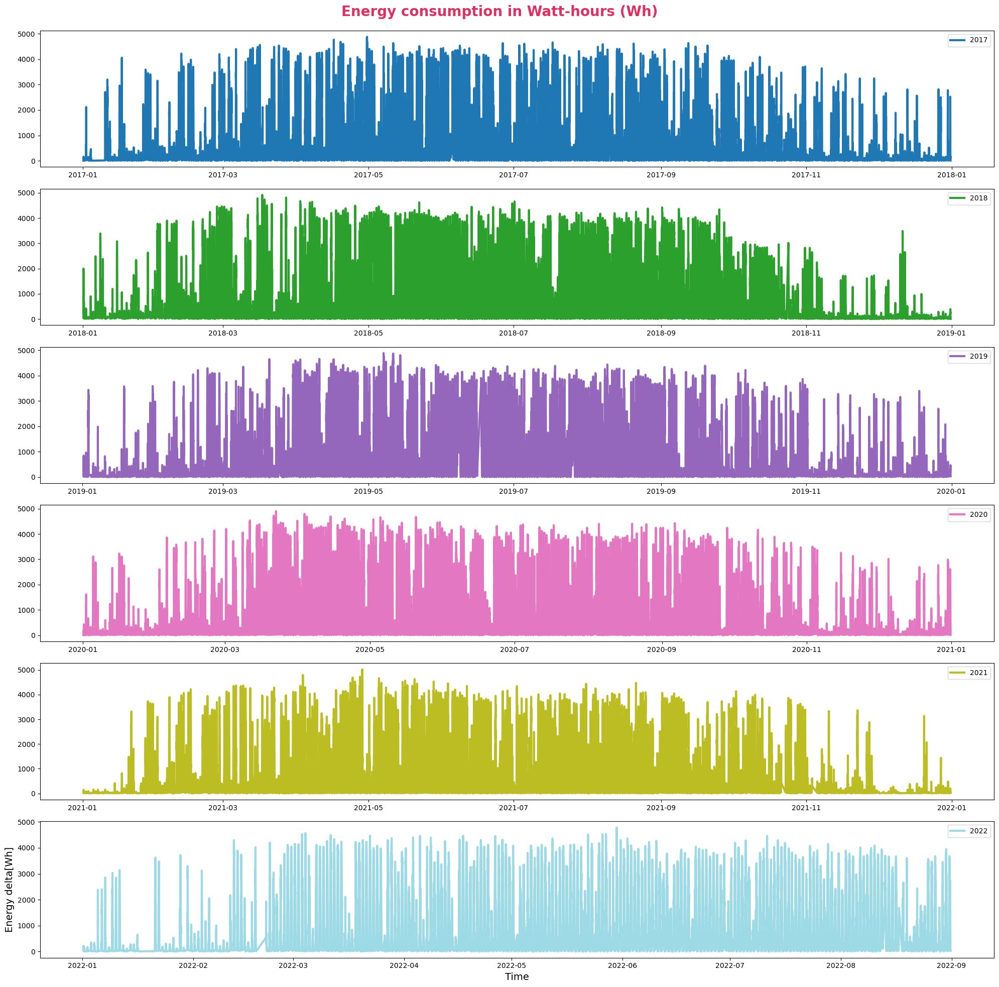

In [13]:
import matplotlib.cm as cm  # Import colormap library

df1 = df[['Time','Energy delta[Wh]']].copy('Deep')
df1 = df1.set_index('Time')

years = [2017, 2018, 2019, 2020, 2021, 2022]

cmap = cm.get_cmap('tab20')  # Choose a colormap with bright colors

fig, axs = plt.subplots(len(years), 1, figsize=(20, 20))  # Adjust figsize for layout
for i, year in enumerate(years):
    df_year = df1[(df1.index >= f"{year}-01-01") & (df1.index < f"{year+1}-01-01")]
    color = cmap(i / (len(years) - 1))  # Get color from colormap based on index
    axs[i].plot(df_year, lw=3, color=color, label=f"{year}")  # Include year as label
    axs[i].legend(loc='upper right')  # Add legend for each subplot
    
# Set common labels and title
axs[-1].set_xlabel('Time', fontsize=14)  # Set on last subplot for all
axs[-1].set_ylabel('Energy delta[Wh]', fontsize=14)  # Set on last subplot for all
plt.suptitle('Energy consumption in Watt-hours (Wh)\n', weight='bold', fontsize=20, color='#DE3163')

# Add legend
#handles, labels = axs[0].get_legend_handles_labels()  # Get labels from last subplot
#plt.legend(handles, labels, loc='upper left', bbox_to_anchor=(1, 1.15), fontsize=12)  # Add legend outside plot

plt.tight_layout()
plt.show()

### Perform and plot seasonal decomposition of a time series for energy consumption

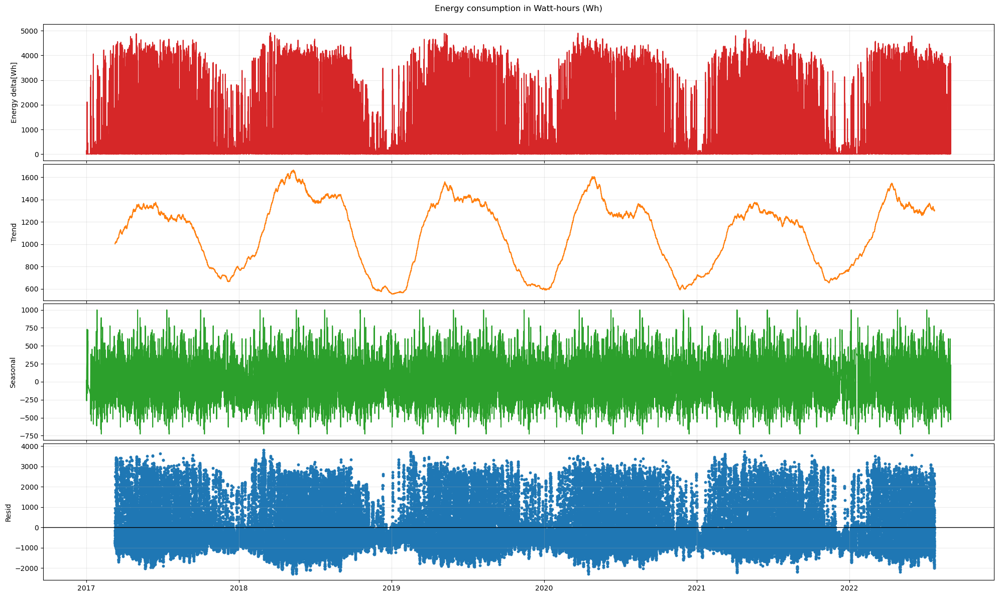

In [14]:
from statsmodels.tsa.seasonal import seasonal_decompose

def seasonal_decompose_plotter(df: pd.DataFrame, period=12, title='', figsize=(20, 12)):
    """
    Parameters:
        df: DataFrame with time series data.
        col: Column name for data to decompose. Default is 'sqrt(O3 AQI)'.
        date_col: Column name for datetime values. Default is 'Date'.
        period: Seasonality period. Default is 12.

    Returns:
        A DecomposeResult object with seasonal, trend, and residual components.

    """
    # Decompostion
    decomposition = seasonal_decompose(df.values, period=period)
    de_season = decomposition.seasonal
    de_resid = decomposition.resid
    de_trend = decomposition.trend

    fig, ax = plt.subplots(4, sharex=True, figsize=figsize)

    ax[0].set_title(title)
    ax[0].plot(df.index, df.values, color='C3')
    ax[0].set_ylabel(df.keys()[0])
    ax[0].grid(alpha=0.25)
    
    ax[1].plot(df.index, de_trend, color='C1')
    ax[1].set_ylabel('Trend')
    ax[1].grid(alpha=0.25)
    
    ax[2].plot(df.index, de_season, color='C2')
    ax[2].set_ylabel('Seasonal')
    ax[2].grid(alpha=0.25)

    ax[3].axhline(y=0, color='k', linewidth=1)
    ax[3].scatter(df.index, de_resid, color='C0', s=10)
    ax[3].set_ylabel('Resid')
    ax[3].grid(alpha=0.25)
    
    plt.tight_layout(h_pad=0)
    plt.show()
    
    return decomposition
 
_ = seasonal_decompose_plotter(df1, period=365*12, title='Energy consumption in Watt-hours (Wh)\n', figsize=(20, 12))

Energy consumption for every year by Month (in this case is January)

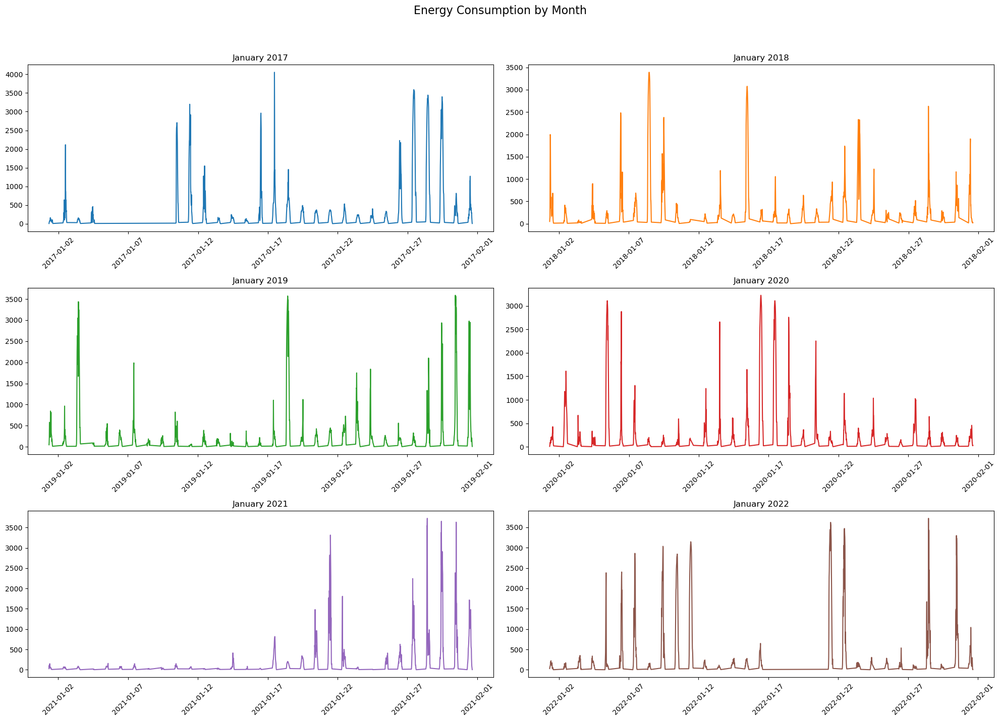

In [15]:
import matplotlib.dates as mdates

month_one   = df1.loc[(df1.index >= '2017-01-01 01:00:00') & (df1.index <= '2017-02-01 01:00:00')]
month_two   = df1.loc[(df1.index >= '2018-01-01 01:00:00') & (df1.index <= '2018-02-01 01:00:00')]
month_three = df1.loc[(df1.index >= '2019-01-01 01:00:00') & (df1.index <= '2019-02-01 01:00:00')]
month_four  = df1.loc[(df1.index >= '2020-01-01 01:00:00') & (df1.index <= '2020-02-01 01:00:00')]
month_five  = df1.loc[(df1.index >= '2021-01-01 01:00:00') & (df1.index <= '2021-02-01 01:00:00')]
month_six   = df1.loc[(df1.index >= '2022-01-01 01:00:00') & (df1.index <= '2022-02-01 01:00:00')]

months = [month_one, month_two, month_three, month_four, month_five, month_six]
month_labels = ['January 2017','January 2018','January 2019', 'January 2020', 'January 2021', 'January 2022']

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(20, 15))
fig.suptitle('Energy Consumption by Month ', fontsize=16)

axes = axes.flatten()

colors = sns.color_palette('tab10', 6)

for i, month in enumerate(months):
    axes[i].plot(month.index, month['Energy delta[Wh]'], color = colors[i])
    axes[i].set_title(month_labels[i])
    
    axes[i].xaxis.set_major_locator(mdates.DayLocator(interval=5))  # Setting x axis tick marks/intervals
    
    axes[i].tick_params(axis='x', rotation=45)  # rotate x-axis labels
    
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout
plt.show()

Energy Consumption in 15 mins interval plot

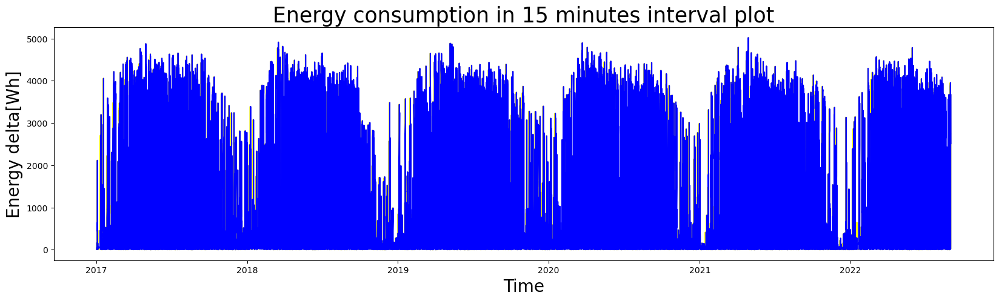

In [16]:
# 15 Minute interval Plot

plt.figure(figsize=(20,5))
plt.plot(df1, color='Yellow')
plt.plot(df1.shift(24), color='Blue')
plt.xlabel('Time', fontsize=20)
plt.ylabel('Energy delta[Wh]', fontsize=20)
plt.title('Energy consumption in 15 minutes interval plot', fontsize=25);

Energy Consumption in hourly interval plot

In [17]:
df2 = df1.reset_index('Time')
df2.head()

,Time,Energy delta[Wh]
0,2017-01-01 08:00:00,5
1,2017-01-01 08:15:00,33
2,2017-01-01 08:30:00,44
3,2017-01-01 08:45:00,61
4,2017-01-01 09:00:00,65


C:\Users\User\AppData\Local\Temp\ipykernel_3552\3290566444.py:5: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  df_hourly = df3.resample('H').mean()


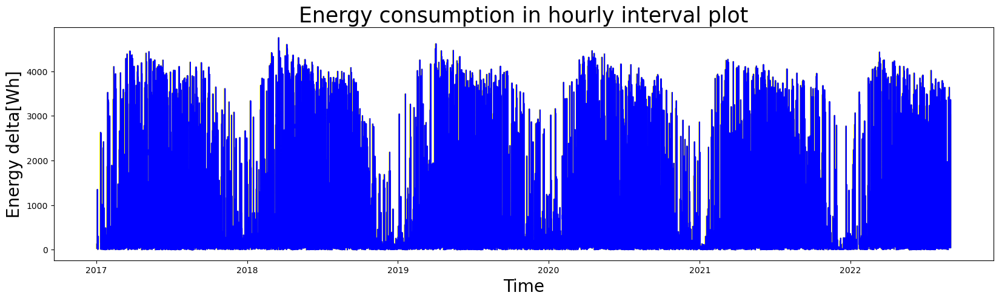

In [18]:
# Hourly Plot

df3 = df2.copy('deep')
df3 = df3.set_index('Time')
df_hourly = df3.resample('H').mean()
df_hourly.head()

plt.figure(figsize=(20,5))
plt.plot(df_hourly, color='Yellow')
plt.plot(df_hourly.shift(24), color='Blue')
plt.xlabel('Time', fontsize=20)
plt.ylabel('Energy delta[Wh]', fontsize=20)
plt.title('Energy consumption in hourly interval plot', fontsize=25);

### Plot ACF and PACF for energy consumption

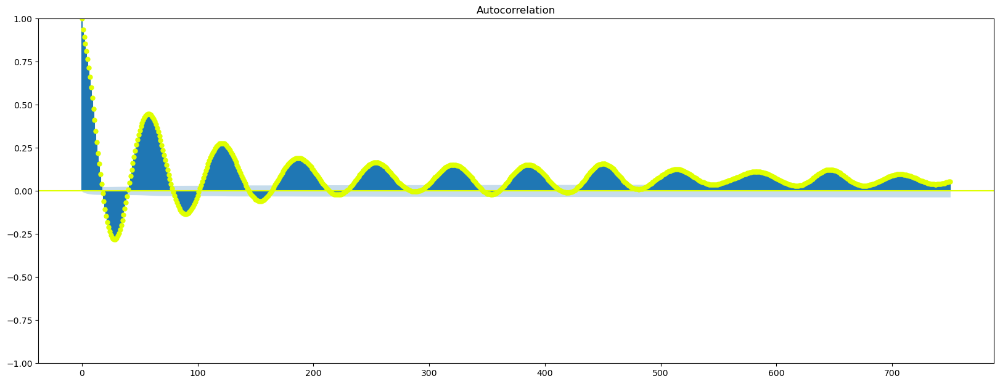

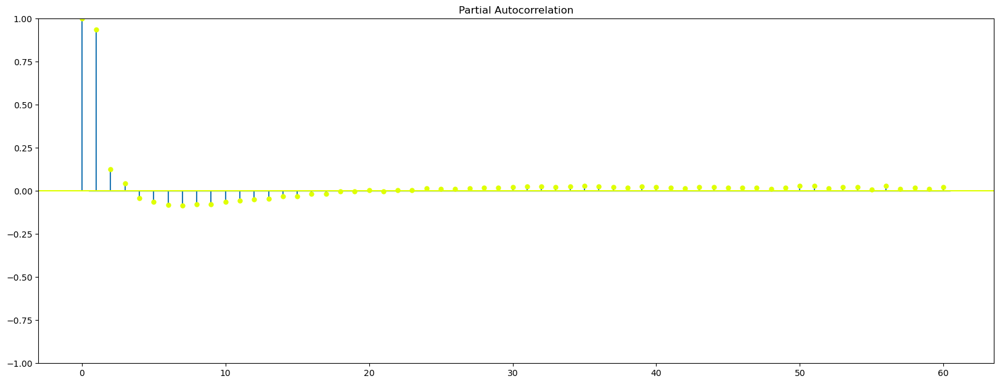

In [25]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

def subplots_acf_pacf(series):
    fig1 = plt.figure(figsize=(20,16))
    ax1 = fig1.add_subplot(211)
    fig1 = plot_acf(series, lags=750, ax=ax1, color='#DFFF00')

    fig2 = plt.figure(figsize=(20,16))
    ax2 = fig2.add_subplot(212)
    fig2 = plot_pacf(series, lags=60, ax=ax2, color='#DFFF00')
    
    plt.show()

subplots_acf_pacf(df1)

### Histogram for all features

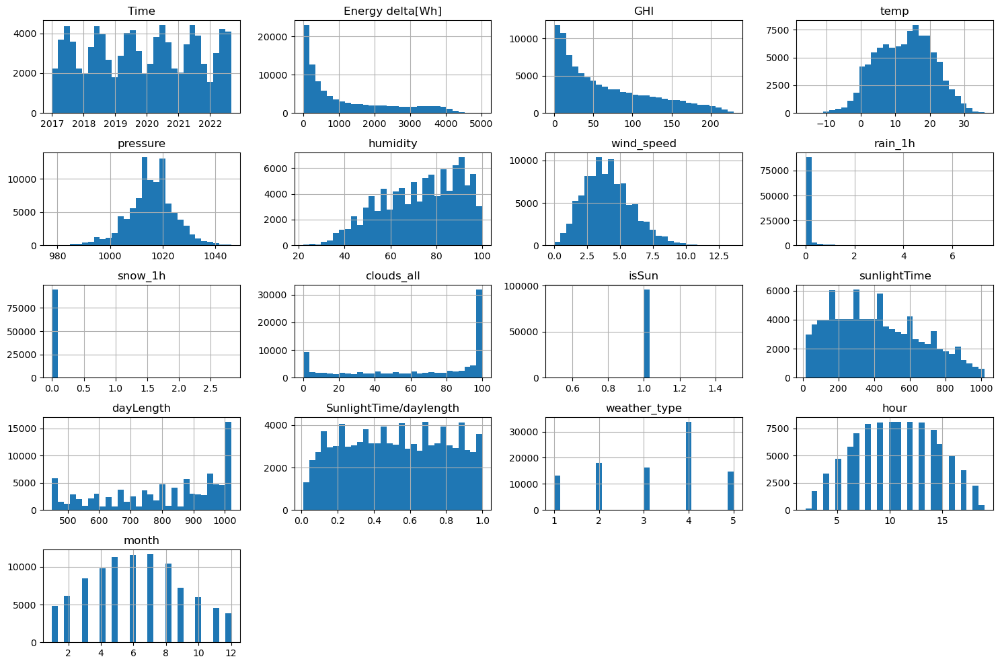

In [26]:
df.hist(bins=30, figsize=(15, 10))
plt.tight_layout()
plt.show()

#### Plot pairwise relationships in the dataset
Generate scatter plots and regression plots for each of the features in this dataset <font color =red>(except 'Overload Condition' and 'Transformer Fault', because they are Boolean values).

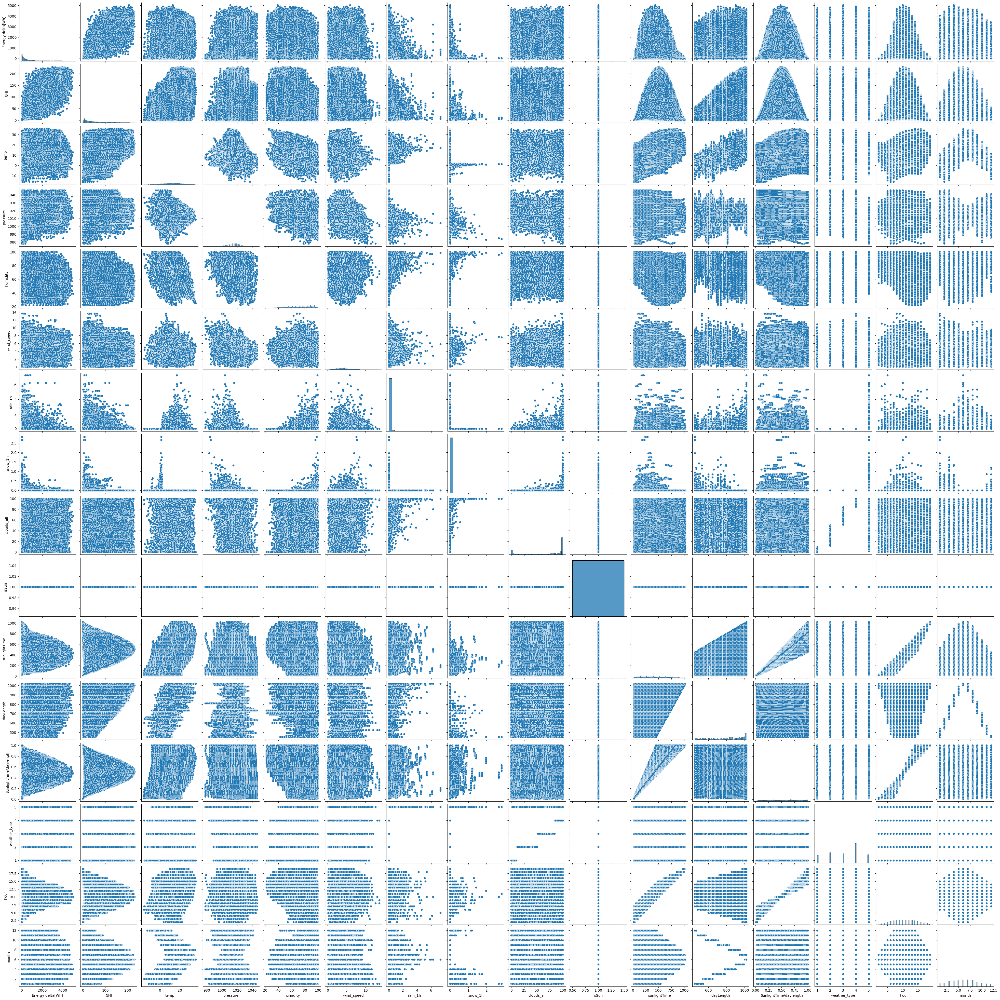

In [27]:
sns.pairplot(df[['Time', 'Energy delta[Wh]', 'GHI', 'temp', 'pressure', 
                 'humidity', 'wind_speed', 'rain_1h', 'snow_1h', 'clouds_all',
                 'isSun', 'sunlightTime', 'dayLength', 'SunlightTime/daylength', 'weather_type',
                 'hour', 'month']])
plt.show()

### Heatmap

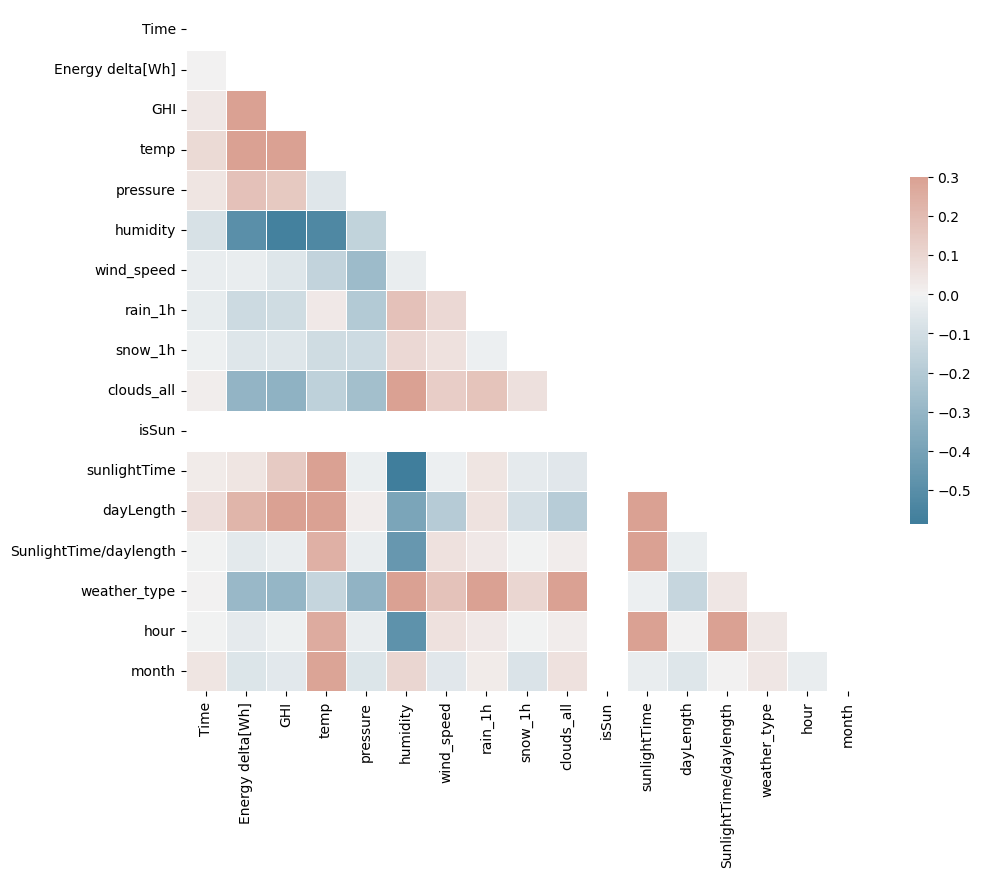

In [28]:
# Compute the correlation matrix
corr = df.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.show()

## Model Building (LSTM)

### Preprocess the data before modeling

#### Min-Max normalization

In [29]:
# Check for NaN values in the original DataFrame
print("NaNs in original data:", df1.isna().any())

# Scaling
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler_data = scaler.fit_transform(df1)
#scaler_data = scaler_data[:, 0]  # Assuming filtered_dfx has only one column

# Check for NaNs after scaling
print("NaNs after scaling:", np.isnan(scaler_data).any())

# Create DataFrame
index = np.arange(0, len(scaler_data), 1)
scaler_df = pd.DataFrame(scaler_data, index=index, columns=['Energy delta[Wh]'])

# Splitting the data
train_size = int(len(scaler_df) * 0.8)
train, test = scaler_df.iloc[0:train_size], scaler_df.iloc[train_size:len(scaler_df)]

print("Train size:", len(train), "Test size:", len(test))

NaNs in original data: Energy delta[Wh]    False
dtype: bool
NaNs after scaling: False
Train size: 76740 Test size: 19186


#### Create training data and test data

In [30]:
def create_dataset(X, y, time_steps=1):
    Xs, ys = [], []
    for i in range(len(X) - time_steps):
        v = X.iloc[i:(i + time_steps)].values
        Xs.append(v)        
        ys.append(y.iloc[i + time_steps])
    return np.array(Xs), np.array(ys)

# Define the time steps
n_steps = 24

# Prepare training data
X_train, y_train = create_dataset(train, train['Energy delta[Wh]'], n_steps)

# Prepare test data
X_test, y_test = create_dataset(test, test['Energy delta[Wh]'], n_steps)

print("Training data shape:", X_train.shape, y_train.shape)
print("Test data shape:", X_test.shape, y_test.shape)

Training data shape: (76716, 24, 1) (76716,)
Test data shape: (19162, 24, 1) (19162,)


### LSTM

In [31]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.layers import SimpleRNN, Dense, Dropout
from tensorflow.keras.models import Sequential

Model building

In [32]:
# Model Architecture
lstm_model = keras.Sequential([
    LSTM(units=128, input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True),
    Dropout(0.2),
    LSTM(units=64),
    Dropout(0.2),
    Dense(units=1)
])

# Compile the model
lstm_model.compile(
    loss='mean_squared_error',
    optimizer=keras.optimizers.Adam(0.001)
)

# Callbacks (Corrected)
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True) # patience=10
model_checkpoint = ModelCheckpoint('best_lstm_model.keras', monitor='val_loss', save_best_only=True)

Model training

In [33]:
# Model Training
history = lstm_model.fit(
    X_train, y_train,
    epochs=250,
    batch_size=24,
    validation_split=0.1,
    verbose=1,
    shuffle=False,
    callbacks=[early_stopping, model_checkpoint]
)

lstm_pred = lstm_model.predict(X_test)
df_lstm_final = test[lstm_pred.shape[0]*-1:].copy()
df_lstm_final['Prediction'] = lstm_pred[:,0]
df_reset_index = df1.reset_index()
df_lstm_final['Date'] = df_reset_index['Time']
df_lstm_final = df_lstm_final.set_index(["Date"], drop=True)

df_lstm_final.head()

Epoch 1/250
2877/2877 ━━━━━━━━━━━━━━━━━━━━ 18s 6ms/step - loss: 0.0114 - val_loss: 0.0089
Epoch 2/250
2877/2877 ━━━━━━━━━━━━━━━━━━━━ 17s 6ms/step - loss: 0.0074 - val_loss: 0.0089
Epoch 3/250
2877/2877 ━━━━━━━━━━━━━━━━━━━━ 18s 6ms/step - loss: 0.0073 - val_loss: 0.0089
Epoch 4/250
2877/2877 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - loss: 0.0071 - val_loss: 0.0086
Epoch 5/250
2877/2877 ━━━━━━━━━━━━━━━━━━━━ 18s 6ms/step - loss: 0.0070 - val_loss: 0.0086
Epoch 6/250
2877/2877 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step - loss: 0.0069 - val_loss: 0.0085
Epoch 7/250
2877/2877 ━━━━━━━━━━━━━━━━━━━━ 18s 6ms/step - loss: 0.0068 - val_loss: 0.0086
Epoch 8/250
2877/2877 ━━━━━━━━━━━━━━━━━━━━ 19s 6ms/step - loss: 0.0067 - val_loss: 0.0083
Epoch 9/250
2877/2877 ━━━━━━━━━━━━━━━━━━━━ 18s 6ms/step - loss: 0.0066 - val_loss: 0.0083
Epoch 10/250
2877/2877 ━━━━━━━━━━━━━━━━━━━━ 18s 6ms/step - loss: 0.0066 - val_loss: 0.0083
Epoch 11/250
2877/2877 ━━━━━━━━━━━━━━━━━━━━ 18s 6ms/step - loss: 0.0066 - val_loss: 0.0083
Epoch 12

,Energy delta[Wh],Prediction
Date,,
2021-07-15 03:30:00,0.019526,0.014419
2021-07-15 03:45:00,0.020124,0.028242
2021-07-15 04:00:00,0.025902,0.023083
2021-07-15 04:15:00,0.033473,0.032766
2021-07-15 04:30:00,0.044630,0.041312


Inverse normalization

In [34]:
df_lstm_final['Energy delta[Wh]'] = scaler.inverse_transform(df_lstm_final['Energy delta[Wh]'].to_numpy().reshape(-1, 1))
df_lstm_final['Prediction'] = scaler.inverse_transform(df_lstm_final['Prediction'].to_numpy().reshape(-1, 1))
df_lstm_final.head()

,Energy delta[Wh],Prediction
Date,,
2021-07-15 03:30:00,99.0,73.369576
2021-07-15 03:45:00,102.0,142.746109
2021-07-15 04:00:00,131.0,116.851418
2021-07-15 04:15:00,169.0,165.452103
2021-07-15 04:30:00,225.0,208.345718


Compute error

In [35]:
df_lstm_final['Error'] = df_lstm_final['Energy delta[Wh]'] - df_lstm_final['Prediction']
df_lstm_final.head()

,Energy delta[Wh],Prediction,Error
Date,,,
2021-07-15 03:30:00,99.0,73.369576,25.630424
2021-07-15 03:45:00,102.0,142.746109,-40.746109
2021-07-15 04:00:00,131.0,116.851418,14.148582
2021-07-15 04:15:00,169.0,165.452103,3.547897
2021-07-15 04:30:00,225.0,208.345718,16.654282


### Plot the figures of the result

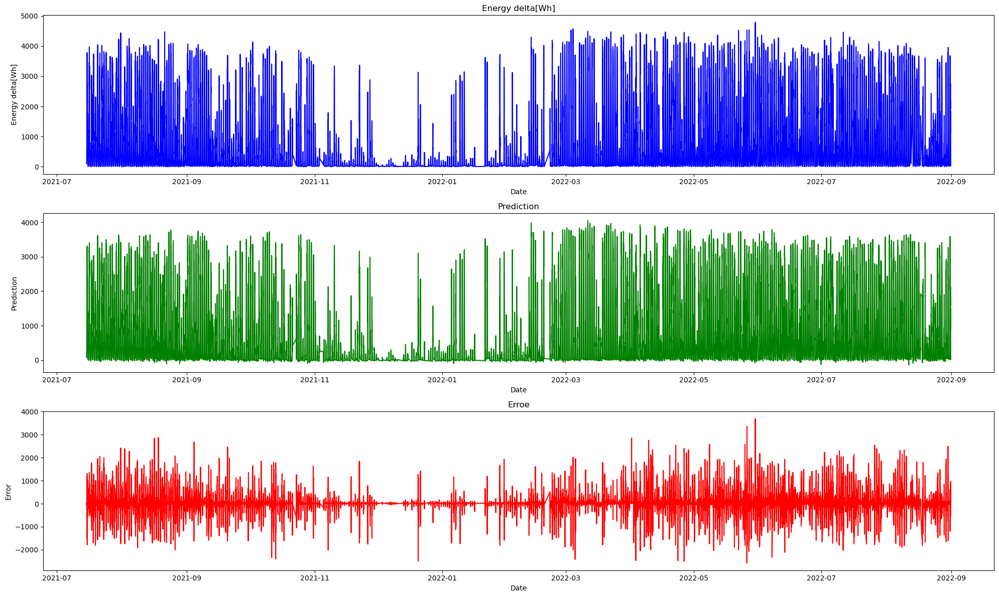

In [36]:
# Create separate plots for each column
fig, axes = plt.subplots(3, 1, figsize=(20, 12))  # Adjust figsize as needed

# Error plot
sns.lineplot(ax=axes[0], data=df_lstm_final, x=df_lstm_final.index, y='Energy delta[Wh]', color='Blue');
axes[0].set_title('Energy delta[Wh]')

# Energy delta[Wh] plot
sns.lineplot(ax=axes[1], data=df_lstm_final, x=df_lstm_final.index, y='Prediction', color = 'Green');
axes[1].set_title('Prediction')

# Prediction plot
sns.lineplot(ax=axes[2], data=df_lstm_final, x=df_lstm_final.index, y='Error', color = 'Red');
axes[2].set_title('Erroe')

# Adjust layout (optional)
plt.tight_layout()

plt.show()

### Plot the comparison of actual value and prediction for energy consumption

In [37]:
print(df2.columns.tolist())

['Time', 'Energy delta[Wh]']


In [38]:
df2.head()

,Time,Energy delta[Wh]
0,2017-01-01 08:00:00,5
1,2017-01-01 08:15:00,33
2,2017-01-01 08:30:00,44
3,2017-01-01 08:45:00,61
4,2017-01-01 09:00:00,65


In [39]:
train2 = train.copy()
train2.index = df2.index[:len(train)]
train2['Energy delta[Wh]'] = scaler.inverse_transform(train2['Energy delta[Wh]'].to_numpy().reshape(-1, 1))
train2['Time'] = df2['Time']
train2 = train2.set_index(['Time'])
train2.head()

,Energy delta[Wh]
Time,
2017-01-01 08:00:00,5.0
2017-01-01 08:15:00,33.0
2017-01-01 08:30:00,44.0
2017-01-01 08:45:00,61.0
2017-01-01 09:00:00,65.0


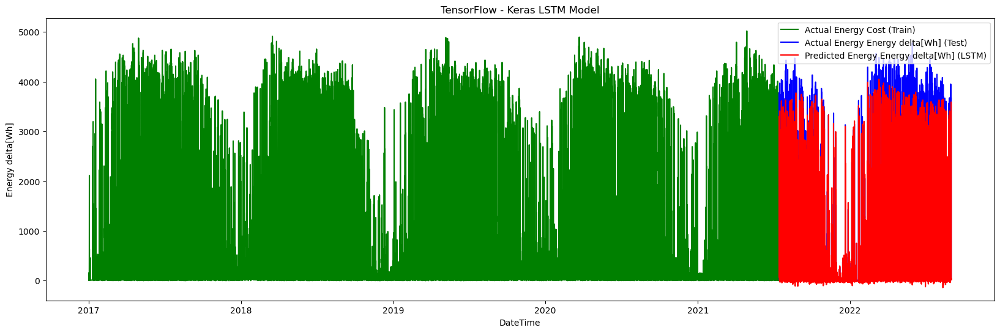

Explained Variance:
	 0.8861212767544518
MAE:
	 236.68092356940898
RMSE:
	 414.18673259608175


In [43]:
from sklearn import metrics

def report_metrics(y_true, y_pred):
    print("Explained Variance:\n\t", metrics.explained_variance_score(y_true, y_pred))
    print("MAE:\n\t", metrics.mean_absolute_error(y_true, y_pred))
    print("RMSE:\n\t", np.sqrt(metrics.mean_squared_error(y_true, y_pred)))
    
plt.figure(figsize=(20,6))
plt.title('TensorFlow - Keras LSTM Model')
plt.plot(train2, color='green', label='Actual Energy Cost (Train)')
plt.xlabel('DateTime')
plt.ylabel('Energy delta[Wh]')
plt.plot(df_lstm_final['Energy delta[Wh]'], color='Blue', label='Actual Energy Energy delta[Wh] (Test)')
plt.plot(df_lstm_final['Prediction'], color='Red', label='Predicted Energy Energy delta[Wh] (LSTM)')
plt.legend()

plt.show()

report_metrics(df_lstm_final['Energy delta[Wh]'].squeeze(), df_lstm_final['Prediction'].squeeze())

## Fb-Prophet (optional)

### Prepare for prophet model

In [44]:
# Format data for prophet model using ds and y
df_final = df1.copy('Deep')
df_final  = df_final.reset_index().rename(columns={'Time':'ds','Energy delta[Wh]':'y'})
df_final.head()


,ds,y
0,2017-01-01 08:00:00,5
1,2017-01-01 08:15:00,33
2,2017-01-01 08:30:00,44
3,2017-01-01 08:45:00,61
4,2017-01-01 09:00:00,65


In [45]:
from prophet import Prophet
## Creating model parameters
model_param ={
    "daily_seasonality": True,
    "weekly_seasonality":True,
    "yearly_seasonality":True,
    "seasonality_mode": "multiplicative",
    "changepoint_prior_scale":0.5
}

ModuleNotFoundError: No module named 'prophet'

Model training

In [ ]:
model = Prophet(**model_param)
model.fit(df_final)
 
# Create future dataframe
future= model.make_future_dataframe(periods=365*24*2 ,freq='h')
forecast= model.predict(future)

Result

In [ ]:
fig = model.plot(forecast, xlabel='Time', ylabel=r'Energy delta[Wh]',figsize=(20, 5))
plt.title('Hourly Generation')
plt.show()

In [ ]:
fig3 = model.plot_components(forecast,uncertainty=True,figsize=(20, 15))
plt.show()

In [ ]:
df_final = df_final[df_final['y'] != 6]
df_final.head()

In [ ]:
df5 = df_final[["ds","y"]]
df5.set_index("ds", inplace = True)

# Color pallete for plotting
color_pal = ["#F8766D", "#D39200", "#93AA00","#00BA38", "#00C19F", "#00B9E3", "#619CFF", "#DB72FB"]
df5.plot(style='.', figsize=(20,5), color=color_pal[5], title='Power Generated By Solar Power Plants in MW only in day Hours')
plt.ylim();
plt.show()


Model training (the other method)

In [ ]:
model = Prophet( daily_seasonality=True, 
                 weekly_seasonality=True,
                 yearly_seasonality=True,
                 seasonality_mode='multiplicative',
                 changepoint_prior_scale=0.5,
                 holidays_prior_scale=0.1)

model.fit(df_final)

future = model.make_future_dataframe(periods=365*24*2,freq='H')
forecast = model.predict(future)
fig = model.plot(forecast,figsize=(20, 6))
plt.show()

Result

In [ ]:
fig = model.plot(forecast,figsize=(20, 6))
plt.xlim(pd.to_datetime(['2022-03-16', '2022-03-26']))
plt.ylim(-1500,5000)
plt.show()

In [ ]:
future2 = future[future['ds'] != 0]       
future2.head()

In [ ]:
forecast2 = model.predict(future2)
fig = model.plot(forecast2,figsize=(20, 6))
plt.show()

In [ ]:
fig = model.plot(forecast2,figsize=(20, 6))
plt.xlim(pd.to_datetime(['2022-03-25', '2022-04-15']))
plt.ylim(-1500,5000)
plt.show()

## Model Building (Regression of features other than 'Time' feature)

### Preprocess the data before modeling.

- Split the data into training and test sets.

    <font color = red> (Here we drop feature "Time" and focus on other features.) </font>

- Use Pipeline to build preprocessors to preprocess different features.
    - **Numeric features:** Replace missing values with the median and then Standardize the data.
      
    - **Categorical features:** Replace missing values with the most frequency, and then one-hot encode the data.

Select a subset of 'Energy delta[Wh]' that is non-zero.

In [25]:
df = df[df['Energy delta[Wh]'] != 0]
df.head()

,Time,Energy delta[Wh],GHI,temp,pressure,humidity,wind_speed,rain_1h,snow_1h,clouds_all,isSun,sunlightTime,dayLength,SunlightTime/daylength,weather_type,hour,month
32,2017-01-01 08:00:00,5,10.6,3.5,1016,99,6.0,0.0,0.0,98,1,60,450,0.13,4,8,1
33,2017-01-01 08:15:00,33,6.0,3.5,1016,99,6.0,0.0,0.0,98,1,75,450,0.17,4,8,1
34,2017-01-01 08:30:00,44,2.8,3.5,1016,99,6.0,0.0,0.0,98,1,90,450,0.20,4,8,1
35,2017-01-01 08:45:00,61,3.1,3.5,1016,99,6.0,0.0,0.0,98,1,105,450,0.23,4,8,1
36,2017-01-01 09:00:00,65,3.5,3.6,1016,97,6.2,0.0,0.0,100,1,120,450,0.27,4,9,1


In [26]:
X = df.drop(['Energy delta[Wh]', 'Time'], axis=1)
#X = df.drop(['Energy delta[Wh]', 'Time', 'hour', 'month'], axis=1)
y = df['Energy delta[Wh]']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


numeric_features = ['GHI', 'temp', 'pressure', 'humidity', 'wind_speed', 
                 'rain_1h', 'snow_1h', 'clouds_all', 'sunlightTime', 'dayLength']

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])


categorical_features = ['isSun', 'weather_type', 'hour', 'month']

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])


preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

### Linear Regression

In [27]:
model = Pipeline(steps=[('preprocessor', preprocessor),
                        ('regressor', LinearRegression())])


model.fit(X_train, y_train)
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error: {mse:.2f}')
print(f'R^2 Score: {r2:.2f}')
print(f'Root Mean Squared Error: {rmse:.2f}')

Mean Squared Error: 244579.21
R^2 Score: 0.84
Root Mean Squared Error: 494.55


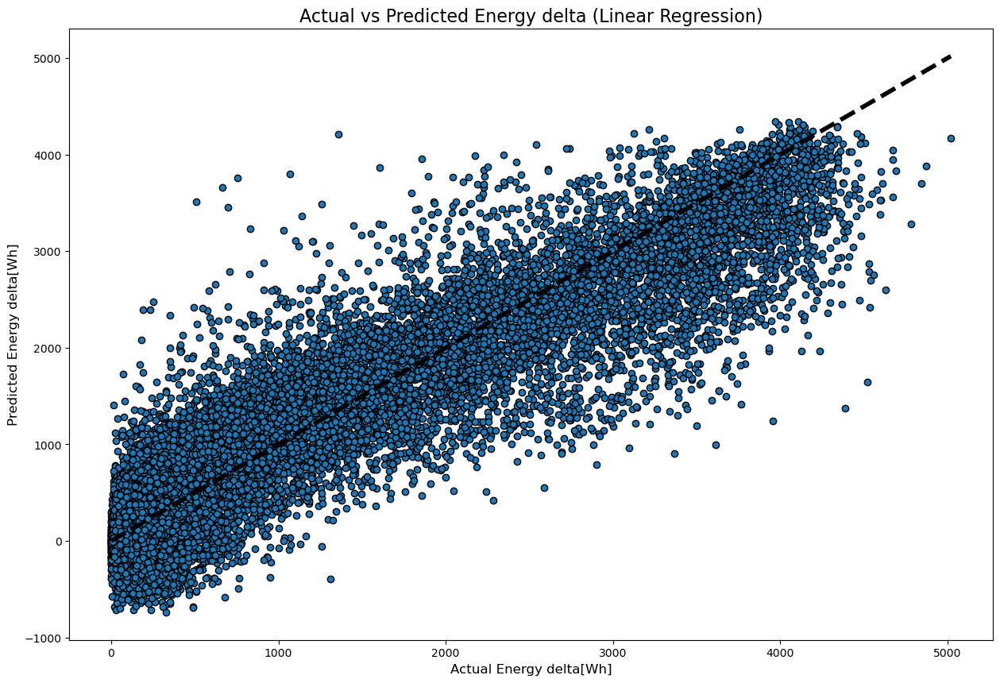

In [28]:
plt.figure(figsize=(15, 10))
plt.scatter(y_test, y_pred, edgecolors=(0, 0, 0))
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=4)
plt.xlabel('Actual Energy delta[Wh]', fontsize=12)
plt.ylabel('Predicted Energy delta[Wh]', fontsize=12)
plt.title('Actual vs Predicted Energy delta (Linear Regression)', fontsize=16)
plt.show()

Residuals

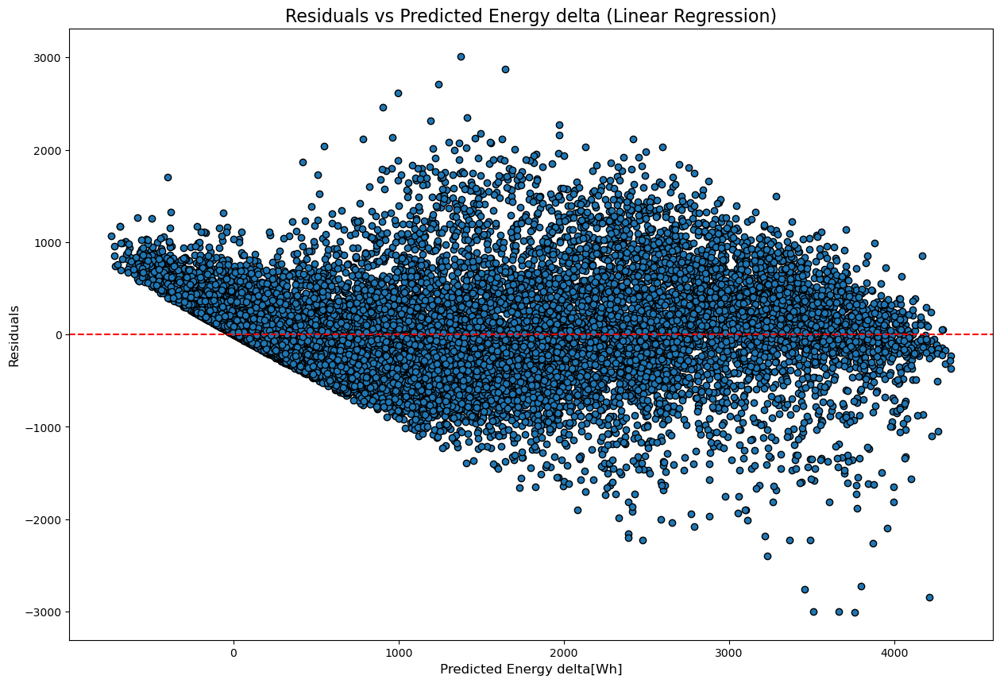

In [29]:
residuals = y_test - y_pred
plt.figure(figsize=(15, 10))
plt.scatter(y_pred, residuals, edgecolors=(0, 0, 0))
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Predicted Energy delta[Wh]', fontsize=12)
plt.ylabel('Residuals', fontsize=12)
plt.title('Residuals vs Predicted Energy delta (Linear Regression)', fontsize=16)
plt.show()

### Random Forest

In [30]:
rf_model = Pipeline(steps=[('preprocessor', preprocessor),
                        ('regressor', RandomForestRegressor())])


rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error: {mse:.2f}')
print(f'R^2 Score: {r2:.2f}')
print(f'Root Mean Squared Error: {rmse:.2f}')

Mean Squared Error: 129062.71
R^2 Score: 0.92
Root Mean Squared Error: 359.25


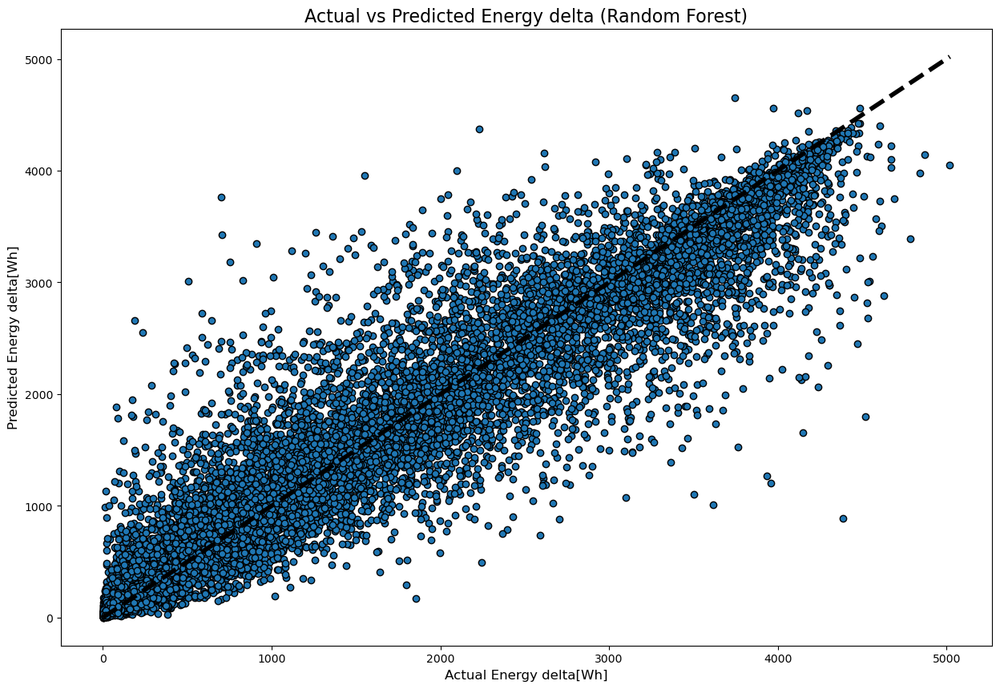

In [31]:
plt.figure(figsize=(15, 10))
plt.scatter(y_test, y_pred, edgecolors=(0, 0, 0))
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=4)
plt.xlabel('Actual Energy delta[Wh]', fontsize=12)
plt.ylabel('Predicted Energy delta[Wh]', fontsize=12)
plt.title('Actual vs Predicted Energy delta (Random Forest)', fontsize=16)
plt.show()

Residuals

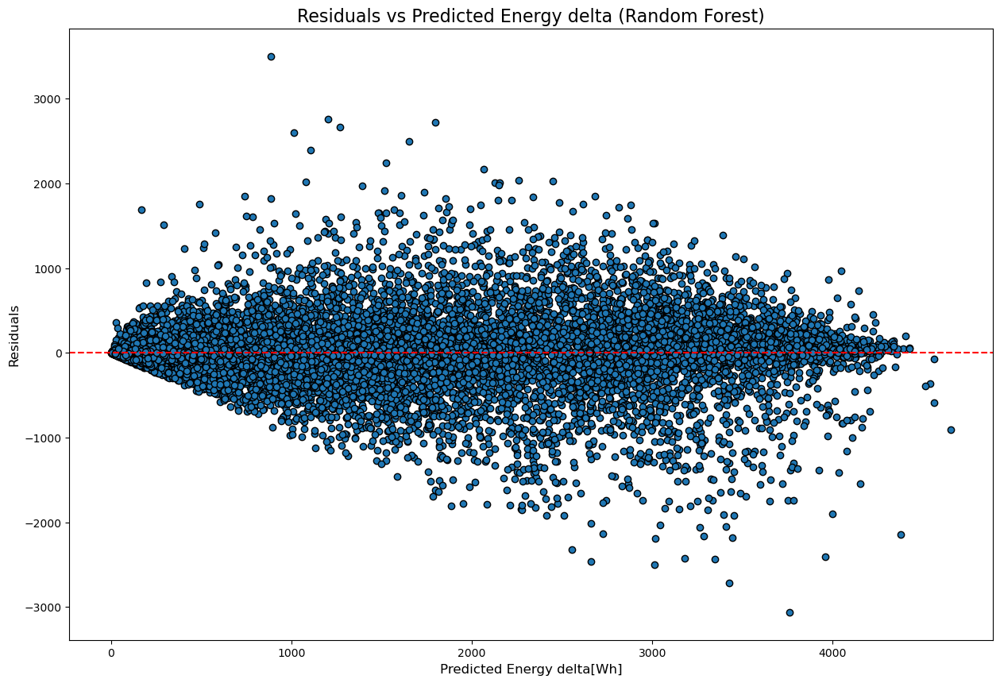

In [32]:
residuals = y_test - y_pred
plt.figure(figsize=(15, 10))
plt.scatter(y_pred, residuals, edgecolors=(0, 0, 0))
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Predicted Energy delta[Wh]', fontsize=12)
plt.ylabel('Residuals', fontsize=12)
plt.title('Residuals vs Predicted Energy delta (Random Forest)', fontsize=16)
plt.show()

### Gradient Boosting Regressor

In [33]:
gb_model = Pipeline(steps=[('preprocessor', preprocessor),
                        ('regressor', GradientBoostingRegressor())])


gb_model.fit(X_train, y_train)
y_pred = gb_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error: {mse:.2f}')
print(f'R^2 Score: {r2:.2f}')
print(f'Root Mean Squared Error: {rmse:.2f}')

Mean Squared Error: 166875.01
R^2 Score: 0.89
Root Mean Squared Error: 408.50


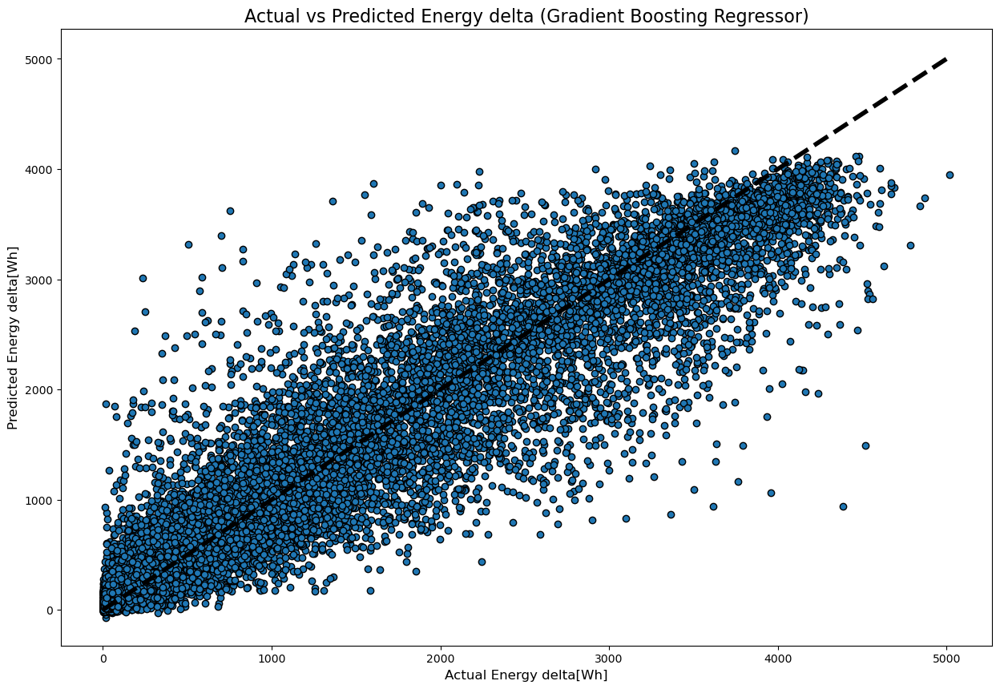

In [34]:
plt.figure(figsize=(15, 10))
plt.scatter(y_test, y_pred, edgecolors=(0, 0, 0))
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=4)
plt.xlabel('Actual Energy delta[Wh]', fontsize=12)
plt.ylabel('Predicted Energy delta[Wh]', fontsize=12)
plt.title('Actual vs Predicted Energy delta (Gradient Boosting Regressor)', fontsize=16)
plt.show()

Residuals

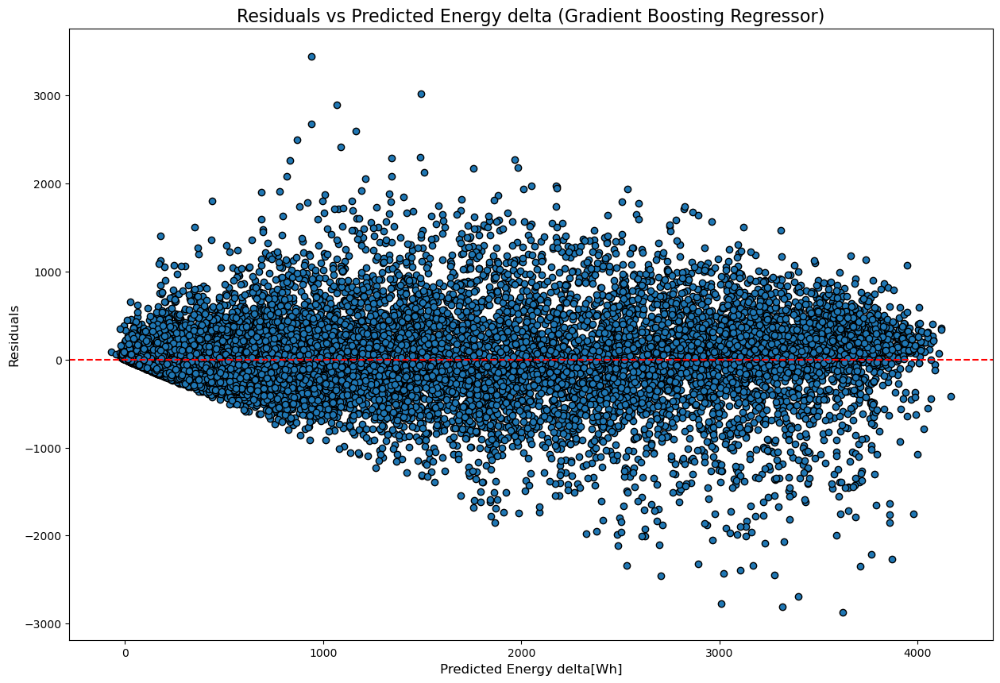

In [35]:
residuals = y_test - y_pred
plt.figure(figsize=(15, 10))
plt.scatter(y_pred, residuals, edgecolors=(0, 0, 0))
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Predicted Energy delta[Wh]', fontsize=12)
plt.ylabel('Residuals', fontsize=12)
plt.title('Residuals vs Predicted Energy delta (Gradient Boosting Regressor)', fontsize=16)
plt.show()

### XGBoost Regressor

In [36]:
xgb_model = Pipeline(steps=[('preprocessor', preprocessor),
                        ('regressor', xgb.XGBRegressor())])


xgb_model.fit(X_train, y_train)
y_pred = xgb_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error: {mse:.2f}')
print(f'R^2 Score: {r2:.2f}')
print(f'Root Mean Squared Error: {rmse:.2f}')

Mean Squared Error: 132606.20
R^2 Score: 0.91
Root Mean Squared Error: 364.15


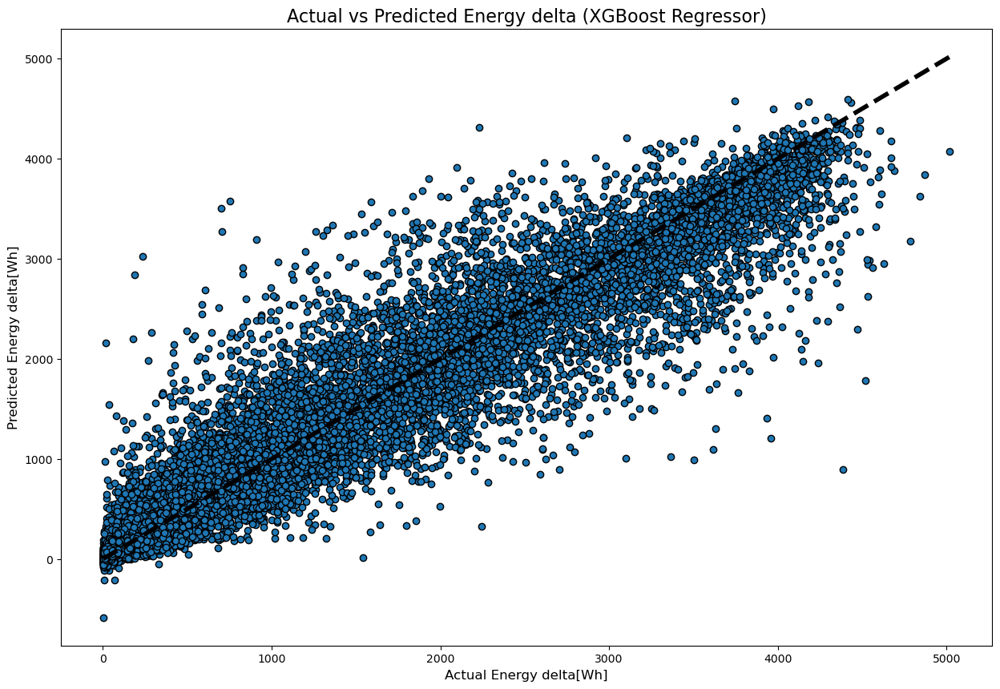

In [37]:
plt.figure(figsize=(15, 10))
plt.scatter(y_test, y_pred, edgecolors=(0, 0, 0))
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=4)
plt.xlabel('Actual Energy delta[Wh]', fontsize=12)
plt.ylabel('Predicted Energy delta[Wh]', fontsize=12)
plt.title('Actual vs Predicted Energy delta (XGBoost Regressor)', fontsize=16)
plt.show()

Residuals

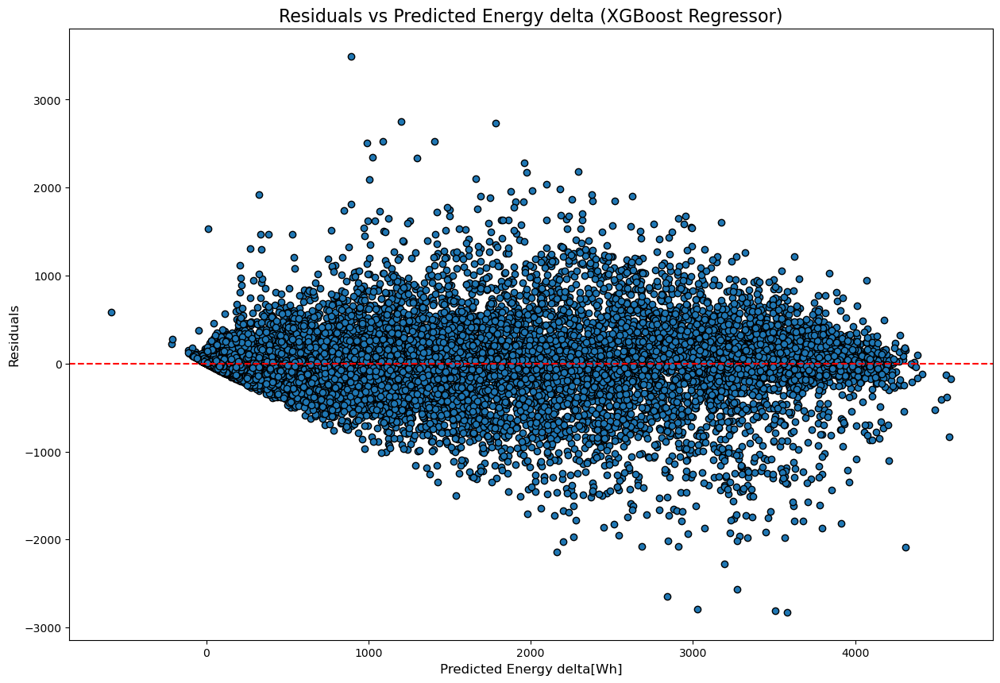

In [38]:
residuals = y_test - y_pred
plt.figure(figsize=(15, 10))
plt.scatter(y_pred, residuals, edgecolors=(0, 0, 0))
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Predicted Energy delta[Wh]', fontsize=12)
plt.ylabel('Residuals', fontsize=12)
plt.title('Residuals vs Predicted Energy delta (XGBoost Regressor)', fontsize=16)
plt.show()

## Compare each Model

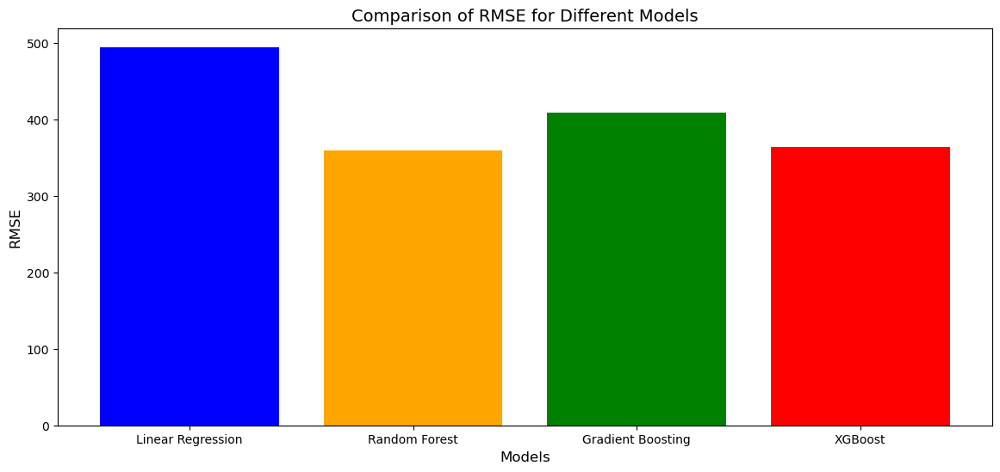

In [40]:
models = ['Linear Regression', 'Random Forest', 'Gradient Boosting', 'XGBoost', ]
rmse_values = [494.55, 359.25, 408.50, 364.15]

plt.figure(figsize=(14, 6))
plt.bar(models, rmse_values, color=['blue', 'orange', 'green', 'red'])

plt.title('Comparison of RMSE for Different Models', fontsize=14)
plt.xlabel('Models', fontsize=12)
plt.ylabel('RMSE', fontsize=12)

plt.show()